In [3]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model

# Define your IMG_SIZE here
IMG_SIZE = 224  # Replace with your desired image size

input_tensor = tf.keras.layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))

base = ResNet50(weights="imagenet", include_top=False, input_tensor=input_tensor, input_shape=(IMG_SIZE, IMG_SIZE, 3))

top = Dense(11, activation='softmax')(
            Dropout(0.5)(
                Dense(2048, activation='relu')(
                    Dropout(0.5)(
                        GlobalAveragePooling2D()(base.output)
                    )
                )
            )
        )

model = Model(input_tensor, top)


In [ ]:
import cv2
import os
import numpy as np
from tensorflow import keras
from keras.layers import Input, Conv2D, MaxPooling2D, LSTM, Dense, TimeDistributed, Flatten
from keras.models import Model
from tqdm import tqdm  # Import tqdm for progress bar

# Define the path to your training data folder
train_data_dir = r"C:\Users\khand\OneDrive\Desktop\CVR\train"

# Define the image size and batch size
IMG_SIZE = (128, 128)
BATCH_SIZE = 16
SEQUENCE_LENGTH = 10  # Adjust the sequence length as needed
EPOCHS = 5

# Create a data generator for your training data
def load_sequence_data(data_dir, sequence_length, img_size):
    sequences = []
    labels = []
    class_names = sorted(os.listdir(data_dir))
    
    for class_name in class_names:
        class_dir = os.path.join(data_dir, class_name)
        if not os.path.isdir(class_dir):
            continue
        
        for root, _, files in os.walk(class_dir):
            image_files = sorted([os.path.join(root, file) for file in files if file.lower().endswith(('.jpg', '.jpeg', '.png'))])
            for i in range(0, len(image_files) - sequence_length, sequence_length):
                sequence = []
                for j in range(i, i + sequence_length):
                    img_path = image_files[j]
                    img = cv2.imread(img_path)
                    if img is not None:
                        img = cv2.resize(img, img_size)
                        img = img / 255.0  # Normalize
                        sequence.append(img)
                    else:
                        print(f"Skipping invalid image: {img_path}")
                if len(sequence) == sequence_length:
                    sequences.append(sequence)
                    labels.append(class_name)
    
    return np.array(sequences), np.array(labels)

train_sequences, train_labels = load_sequence_data(train_data_dir, SEQUENCE_LENGTH, IMG_SIZE)

# Define a model architecture with LSTM layers
input_layer = Input(shape=(SEQUENCE_LENGTH,) + IMG_SIZE + (3,))
x = TimeDistributed(Conv2D(32, (3, 3), activation='relu'))(input_layer)
x = TimeDistributed(MaxPooling2D(pool_size=(2, 2)))(x)
x = TimeDistributed(Flatten())(x)
x = LSTM(64, return_sequences=True)(x)
x = Flatten()(x)
output_layer = Dense(7, activation='softmax')(x)
sequence_model = Model(inputs=input_layer, outputs=output_layer)

# Compile your model
sequence_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Train your model with a progress bar
for epoch in range(EPOCHS):
    print(f"Epoch {epoch + 1}/{EPOCHS}")
    progress_bar = tqdm(total=len(train_sequences))
    
    history = sequence_model.fit(
        train_sequences,
        keras.utils.to_categorical(train_labels, num_classes=7),
        epochs=1,
        batch_size=BATCH_SIZE,
        verbose=0,
        callbacks=[keras.callbacks.LambdaCallback(on_epoch_end=lambda batch, logs: progress_bar.update(BATCH_SIZE))],
    )
    
    progress_bar.close()
    print(f"Epoch {epoch + 1}/{EPOCHS} - loss: {history.history['loss'][0]}, accuracy: {history.history['accuracy'][0]}")

# Save your trained model
sequence_model.save('trained_sequence_model_with_LSTM.h5')


In [5]:
for layer in model.layers:
    layer.trainable = False

for i in range(-5, 0):
    model.layers[i].trainable = True


In [6]:
import keras 
model.compile(keras.optimizers.Adam(lr=10e-5),loss = 'categorical_crossentropy',metrics = ['accuracy'])

In [2]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define the data directory for your video frames
data_dir = r"C:\Users\khand\OneDrive\Desktop\CVR\train"

# Set up an ImageDataGenerator for data augmentation and preprocessing
batch_size = 16
image_size = (224, 224)  # ResNet-50 default input size

datagen = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2  # Split 20% of the data for validation
)


In [3]:
# Create a generator for both training and validation data
generator = datagen.flow_from_directory(
    data_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'  # Specify 'training' or 'validation'
)


Found 115247 images belonging to 7 classes.


In [4]:
# Load pre-trained ResNet-50 model without top (fully connected) layers
base_model = ResNet50(weights='imagenet', include_top=False, input_tensor=Input(shape=(224, 224, 3)))
NUM_CLASSES=7
# Add custom top layers for your specific classification task
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(NUM_CLASSES, activation='softmax')(x)


In [5]:
# Create and compile the model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [ ]:
# Train the model
epochs =  10 #js needed
history = model.fit(
    generator,
    epochs=epochs,
    verbose=1
)


Epoch 1/10
7203/7203 [==============================] - 8817s 1s/step - loss: 1.5428 - accuracy: 0.3992
Epoch 2/10
7203/7203 [==============================] - 13129s 2s/step - loss: 1.3282 - accuracy: 0.4942
Epoch 3/10
7203/7203 [==============================] - 8808s 1s/step - loss: 1.2267 - accuracy: 0.5331
Epoch 4/10
7203/7203 [==============================] - 8908s 1s/step - loss: 1.1629 - accuracy: 0.5596
Epoch 5/10
7203/7203 [==============================] - 8682s 1s/step - loss: 1.1099 - accuracy: 0.5838
Epoch 6/10
7203/7203 [==============================] - 8810s 1s/step - loss: 1.0737 - accuracy: 0.5952
Epoch 7/10
7203/7203 [==============================] - 8712s 1s/step - loss: 1.0399 - accuracy: 0.6099
Epoch 8/10
1799/7203 [======>.......................] - ETA: 1:46:28 - loss: 1.0236 - accuracy: 0.6150

In [11]:
# Save the trained model
model.save('video_frame_resnet50.h5')

# Optionally, fine-tune the model by unfreezing some layers and continuing training


C:\Users\khand\anaconda3\trial\Lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [21]:
import matplotlib.pyplot as plt 
import numpy as np 
import cv2 
img = cv2.imread(r"C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g03_c04\v_BrushingTeeth_g03_c04\v_BrushingTeeth_g03_c04_000.jpg")
print(img.shape)

(224, 224, 3)


In [3]:
#attempt 3 to improve accuracy 
import os
import numpy as np
import imageio
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Constants
NUM_CLASSES = 7  # Update with the number of classes in your dataset
BATCH_SIZE = 32  # Adjust based on available memory
IMAGE_SIZE = (224, 224)  # ResNet-50 default input size

# Define the data directory for your video frames
data_dir = r"C:\Users\khand\OneDrive\Desktop\CVR\train"


In [4]:
# Set up an ImageDataGenerator for data augmentation and preprocessing
datagen = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=45,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2  # Split 20% of the data for validation
)

# Create a generator for both training and validation data
generator = datagen.flow_from_directory(
    data_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'  # Specify 'training' or 'validation'
)


Found 115247 images belonging to 7 classes.


In [5]:
# Load pre-trained ResNet-50 model without top (fully connected) layers
base_model = ResNet50(weights='imagenet', include_top=False, input_tensor=Input(shape=(224, 224, 3)))

# Create a feature extractor using the pre-trained ResNet-50 model
feature_extractor = Model(inputs=base_model.input, outputs=base_model.layers[-2].output)

# Add custom top layers for your specific classification task
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(NUM_CLASSES, activation='softmax')(x)

# Create and compile the model
model = Model(inputs=base_model.input, outputs=predictions)

# Unfreeze layers for fine-tuning (e.g., the last convolutional block)
for layer in base_model.layers[-5:]:
    layer.trainable = True

In [14]:
# Define a learning rate scheduler
def lr_schedule(epoch):
    initial_learning_rate = 0.001
    if epoch < 5:
        return initial_learning_rate
    else:
        return initial_learning_rate * np.exp(0.1 * (5 - epoch))

# Compile the model with a learning rate scheduler
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping

lr_scheduler = LearningRateScheduler(lr_schedule)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

optimizer = Adam(learning_rate=lr_schedule(0))
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [15]:
# Train the model
epochs = 5 # You can adjust the number of epochs
history = model.fit(
    generator,
    epochs=epochs,
    verbose=1,
    callbacks=[lr_scheduler, early_stopping],
)


Epoch 1/5
3602/3602 [==============================] - 35406s 10s/step - loss: 0.1123 - accuracy: 0.9645 - lr: 0.0010
Epoch 2/5
3602/3602 [==============================] - 35694s 10s/step - loss: 0.0340 - accuracy: 0.9893 - lr: 0.0010
Epoch 3/5
3602/3602 [==============================] - 39048s 11s/step - loss: 0.0203 - accuracy: 0.9940 - lr: 0.0010
Epoch 4/5
3602/3602 [==============================] - 38990s 11s/step - loss: 0.0153 - accuracy: 0.9956 - lr: 0.0010
Epoch 5/5
3602/3602 [==============================] - 37436s 10s/step - loss: 0.0117 - accuracy: 0.9965 - lr: 0.0010


In [14]:
model.save('trained_model.keras')


In [16]:
import os
import numpy as np
import imageio
from tensorflow_docs.vis import embed
from tensorflow.keras.models import load_model
import random

# Define your class labels
class_labels = ['BlowDryHair', 'BrushingTeeth', 'CuttingInKitchen', 'Haircut', 'MoppingFloor', 'ShavingBeard', 'Typing', 'WritingOnBoard']

# Function to load frames from a video sequence
def load_frames(video_path):
    frames = []
    for filename in os.listdir(video_path):
        if filename.endswith(".jpg"):  # Adjust the file extension as needed
            frame = imageio.imread(os.path.join(video_path, filename))
            frames.append(frame)
    return np.array(frames)

# Function to prepare a single video
def prepare_single_video(frames):
    frames = frames[None, ...]
    frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
    frame_features = np.zeros(shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

    for i, batch in enumerate(frames):
        video_length = batch.shape[0]
        length = min(MAX_SEQ_LENGTH, video_length)
        for j in range(length):
            frame_features[i, j, :] = feature_extractor.predict(batch[j, :][None, :])
        frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

    return frame_features, frame_mask

# Function to predict the class label for a video
def sequence_prediction(frames, model):
    frame_features, frame_mask = prepare_single_video(frames)
    probabilities = model.predict([frame_features, frame_mask])[0]

    for i in np.argsort(probabilities)[::-1]:
        print(f"  {class_labels[i]}")

    return frames

# Function to convert images into a GIF
def to_gif(images):
    converted_images = images.astype(np.uint8)
    imageio.mimsave("animation.gif", converted_images, fps=10)
    return embed.embed_file("animation.gif")

# Set your paths and parameters
top_level_folder = r"C:\Users\khand\OneDrive\Desktop\CVR\test"  # Modify the path to your top-level folder
MAX_SEQ_LENGTH = 1 # Adjust as needed
NUM_FEATURES = 2048  # Modify based on your feature extractor model

# Load your pre-trained model
sequence_model = load_model("trained_model.keras")  # Load your trained model

# Get a list of class folders
class_folders = [os.path.join(top_level_folder, class_label) for class_label in class_labels]

# Process a random subset of three video sequences
random.seed(123)  # Set a random seed for reproducibility
selected_class_folders = random.sample(class_folders, 3)

for class_folder in selected_class_folders:
    video_folders = os.listdir(class_folder)
    random_video_folder = random.choice(video_folders)
    video_path = os.path.join(class_folder, random_video_folder)
    
    print(f"Processing video: {video_path}")
    frames = load_frames(video_path)
    if len(frames) > 0:
        test_frames = sequence_prediction(frames, sequence_model)
        to_gif(test_frames[:MAX_SEQ_LENGTH])


Processing video: C:\Users\khand\OneDrive\Desktop\CVR\test\BlowDryHair\v_BlowDryHair_g14_c02
Processing video: C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g13_c03
Processing video: C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g05_c05


In [17]:
print(sequence_model.summary())


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                        

In [1]:
#testing 
import os
import numpy as np
import imageio
from tensorflow.keras.models import load_model

# Define your class labels
class_labels = ['BlowDryHair', 'BrushingTeeth', 'CuttingInKitchen', 'Haircut', 'MoppingFloor', 'ShavingBeard', 'Typing', 'WritingOnBoard']


In [2]:
# Function to load frames from a video sequence
def load_frames(video_path):
    frames = []
    for filename in os.listdir(video_path):
        if filename.endswith(".jpg"):  # Adjust the file extension as needed
            frame = imageio.imread(os.path.join(video_path, filename))
            frames.append(frame)
    return np.array(frames)


In [3]:
# Function to prepare a single video
def prepare_single_video(frames):
    frames = frames[None, ...]
    frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
    frame_features = np.zeros(shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

    for i, batch in enumerate(frames):
        video_length = batch.shape[0]
        length = min(MAX_SEQ_LENGTH, video_length)
        for j in range(length):
            frame_features[i, j, :] = feature_extractor.predict(batch[j, :][None, :])
        frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

    return frame_features, frame_mask


In [4]:
# Function to predict the class labels for a video
def predict_top_labels(frames, model):
    frame_features, frame_mask = prepare_single_video(frames)
    probabilities = model.predict([frame_features, frame_mask])[0]

    top_classes = np.argsort(probabilities)[::-1][:5]  # Get the top 5 predicted classes

    top_labels = [class_labels[i] for i in top_classes]
    
    return top_labels


In [5]:
# Set your paths and parameters
video_folder_to_test = r"C:\Users\khand\OneDrive\Desktop\CVR\test\BlowDryHair\v_BlowDryHair_g01_c04\v_BlowDryHair_g01_c04"  # Replace with the path to your video frames folder
MAX_SEQ_LENGTH = 1  # Adjust as needed
NUM_FEATURES = 2048  # Modify based on your feature extractor model

# Load your pre-trained model
model_path = "trained_model.keras"  # Replace with the path to your trained model
sequence_model = load_model(model_path)  # Load your trained model


In [6]:
# Load frames from the video folder
frames_to_test = load_frames(video_folder_to_test)


C:\Users\khand\AppData\Local\Temp\ipykernel_13636\1793322011.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frame = imageio.imread(os.path.join(video_path, filename))


In [8]:
# Function to prepare a single video using the feature extractor
def prepare_single_video(frames):
    frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
    frame_features = np.zeros(shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

    for i, frame in enumerate(frames):
        if i >= MAX_SEQ_LENGTH:
            break

        frame_features[0, i, :] = feature_extractor.predict(frame[None, ...])
        frame_mask[0, i] = 1  # 1 = not masked, 0 = masked

    return frame_features, frame_mask


In [9]:
# Function to predict the top 5 labels for a video
def predict_top_labels(frames, model):
    frame_features, frame_mask = prepare_single_video(frames)
    probabilities = model.predict([frame_features, frame_mask])[0]

    top_classes = np.argsort(probabilities)[::-1][:5]  # Get the top 5 predicted classes

    top_labels = [class_labels[i] for i in top_classes]

    return top_labels


In [44]:
#testing on random video frames 1 
import os
import numpy as np
import imageio
from tensorflow.keras.models import load_model
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image

# Constants
NUM_CLASSES = 7  # Update with the number of classes in your dataset
BATCH_SIZE = 32  # Adjust based on available memory
IMAGE_SIZE = (224, 224)  # ResNet-50 default input size
MAX_SEQ_LENGTH = 169  # Adjust as needed

# Define your class labels
class_labels = ['BlowDryHair', 'BrushingTeeth', 'CuttingInKitchen', 'Haircut', 'MoppingFloor', 'ShavingBeard', 'Typing', 'WritingOnBoard']

# Define the data directory for your video frames
data_dir = r"C:\Users\khand\OneDrive\Desktop\CVR\train"

# Load your pre-trained model
model_path = "trained_model.keras"  # Replace with the path to your trained model
sequence_model = load_model(model_path)  # Load your trained model

# Load frames from a video sequence
def load_frames(video_path):
    frames = []
    for filename in os.listdir(video_path):
        if filename.endswith(".jpg"):  # Adjust the file extension as needed
            frame_path = os.path.join(video_path, filename)
            frame = image.load_img(frame_path, target_size=IMAGE_SIZE)
            frame = image.img_to_array(frame)
            frames.append(frame)
    return np.array(frames)

# Function to predict the top 5 labels and their probabilities for a video
def predict_top_labels_with_probabilities(frames, model):
    probabilities = model.predict(frames)

    top_classes = np.argsort(probabilities)[0][::-1][:5]  # Get the top 5 predicted classes
    top_probabilities = [probabilities[0, i] for i in top_classes]

    top_labels = [class_labels[i] for i in top_classes]

    return top_labels, top_probabilities

# Set your paths and parameters
video_folder_to_test = r"C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g05_c02\v_CuttingInKitchen_g05_c02" # Replace with the path to your video frames folder

# Load frames from the video folder and resize them to (224, 224, 3)
frames_to_test = load_frames(video_folder_to_test)

# Predict the top 5 labels and their probabilities for the video frames
top_labels, top_probabilities = predict_top_labels_with_probabilities(frames_to_test, sequence_model)

# Print the top 5 predicted labels and their corresponding probabilities
print("Top 5 predicted labels with probabilities:")
for label, probability in zip(top_labels, top_probabilities):
    print(f"{label}: {probability * 100:.2f}%")


8/8 [==============================] - 37s 4s/step
Top 5 predicted labels with probabilities:
CuttingInKitchen: 29.78%
BrushingTeeth: 23.44%
Typing: 14.81%
ShavingBeard: 14.57%
MoppingFloor: 6.74%


In [32]:
#testing on random video 2 
import os
import numpy as np
import imageio
from tensorflow.keras.models import load_model
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image

# Constants
NUM_CLASSES = 7  # Update with the number of classes in your dataset
BATCH_SIZE = 32  # Adjust based on available memory
IMAGE_SIZE = (224, 224)  # ResNet-50 default input size
MAX_SEQ_LENGTH = 200  # Adjust as needed

# Define your class labels
class_labels = ['BlowDryHair', 'BrushingTeeth', 'CuttingInKitchen', 'Haircut', 'MoppingFloor', 'Typing', 'WritingOnBoard']

# Define the data directory for your video frames
data_dir = r"C:\Users\khand\OneDrive\Desktop\CVR\train"

# Load your pre-trained model
model_path = "trained_model.keras"  # Replace with the path to your trained model
sequence_model = load_model(model_path)  # Load your trained model

# Load frames from a video sequence
def load_frames(video_path):
    frames = []
    for filename in os.listdir(video_path):
        if filename.endswith(".jpg"):  # Adjust the file extension as needed
            frame_path = os.path.join(video_path, filename)
            frame = image.load_img(frame_path, target_size=IMAGE_SIZE)
            frame = image.img_to_array(frame)
            frames.append(frame)
    return np.array(frames)

# Function to predict the top 5 labels and their probabilities for a video
def predict_top_labels_with_probabilities(frames, model):
    probabilities = model.predict(frames)

    top_classes = np.argsort(probabilities)[0][::-1][:5]  # Get the top 5 predicted classes
    top_probabilities = [probabilities[0, i] for i in top_classes]

    top_labels = [class_labels[i] for i in top_classes]

    return top_labels, top_probabilities

# Set your paths and parameters
video_folder_to_test = r"C:\Users\khand\OneDrive\Desktop\CVR\test\Typing\v_Typing_g03_c04\v_Typing_g03_c04"# Replace with the path to your video frames folder

# Load frames from the video folder and resize them to (224, 224, 3)
frames_to_test = load_frames(video_folder_to_test)

# Predict the top 5 labels and their probabilities for the video frames
top_labels, top_probabilities = predict_top_labels_with_probabilities(frames_to_test, sequence_model)

# Print the top 5 predicted labels and their corresponding probabilities
print("Top 5 predicted labels with probabilities:")
for label, probability in zip(top_labels, top_probabilities):
    print(f"{label}: {probability * 100:.2f}%")


8/8 [==============================] - 41s 5s/step
Top 5 predicted labels with probabilities:
Typing: 24.04%
MoppingFloor: 23.57%
ShavingBeard: 19.87%
BrushingTeeth: 14.01%
CuttingInKitchen: 9.70%


In [52]:
#temporary fix 
import os
import numpy as np
import imageio
from tensorflow.keras.models import load_model
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image

# Constants
NUM_CLASSES = 7  # Update with the number of classes in your dataset
BATCH_SIZE = 32  # Adjust based on available memory
IMAGE_SIZE = (224, 224)  # ResNet-50 default input size
MAX_SEQ_LENGTH = 200  # Adjust as needed

# Define your class labels
class_labels = ['BlowDryHair', 'BrushingTeeth', 'CuttingInKitchen', 'Haircut', 'MoppingFloor', 'Typing', 'WritingOnBoard']

# Define the data directory for your video frames
data_dir = r"C:\Users\khand\OneDrive\Desktop\CVR\train"

# Load your pre-trained model
model_path = "trained_model.keras"  # Replace with the path to your trained model
sequence_model = load_model(model_path)  # Load your trained model

# Load frames from a video sequence
def load_frames(video_path):
    frames = []
    for filename in os.listdir(video_path):
        if filename.endswith(".jpg"):  # Adjust the file extension as needed
            frame_path = os.path.join(video_path, filename)
            frame = image.load_img(frame_path, target_size=IMAGE_SIZE)
            frame = image.img_to_array(frame)
            frames.append(frame)
    return np.array(frames)

# Function to predict the top 5 labels and their probabilities for a video
def predict_top_labels_with_probabilities(frames, model):
    probabilities = model.predict(frames)

    top_classes = np.argsort(probabilities)[0][::-1][:3]  # Get the top 5 predicted classes
    top_probabilities = [probabilities[0, i] for i in top_classes]

    top_labels = [class_labels[i] for i in top_classes]

    return top_labels, top_probabilities

# Function to extract the class label from the filename
def extract_class_label(filename):
    # You may need to customize this function based on your filename format
    # This example assumes that the class label is part of the filename
    # For example, "BlowDryHair_video1.jpg" would be labeled as "BlowDryHair"
    for label in class_labels:
        if label in filename:
            return label
    return None

# Set your paths and parameters
video_folder_to_test = r"C:\Users\khand\OneDrive\Desktop\CVR\test\Typing\v_Typing_g06_c02\v_Typing_g06_c02" # Replace with the path to your video frames folder

# Load frames from the video folder and resize them to (224, 224, 3)
frames_to_test = load_frames(video_folder_to_test)

# Extract the class label from the filename
filename = os.path.basename(video_folder_to_test)  # Get the filename
class_label = extract_class_label(filename)

if class_label:
    print(f"Predicting class for {filename} based on filename: {class_label}")
    
    # Predict the top 5 labels and their probabilities for the video frames
    top_labels, top_probabilities = predict_top_labels_with_probabilities(frames_to_test, sequence_model)

    # Print the top 5 predicted labels and their corresponding probabilities
    print("Top 5 predicted labels with probabilities:")
    for label, probability in zip(top_labels, top_probabilities):
        print(f"{label}: {probability * 100:.2f}%")
else:
    print(f"Could not determine class label for {filename}.")


Predicting class for v_Typing_g06_c02 based on filename: Typing
4/4 [==============================] - 21s 5s/step
Top 5 predicted labels with probabilities:
Typing: 31.68%
WritingOnBoard: 27.31%
MoppingFloor: 12.50%


In [50]:
import os
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input

# Constants
NUM_CLASSES = 7  # Update with the number of classes in your dataset
BATCH_SIZE = 32  # Adjust based on available memory
IMAGE_SIZE = (224, 224)  # ResNet-50 default input size
MAX_SEQ_LENGTH = 100  # Adjust as needed

# Define your class labels
class_labels = ['BlowDryHair', 'BrushingTeeth', 'CuttingInKitchen', 'Haircut', 'MoppingFloor', 'Typing', 'WritingOnBoard']

# Define the data directory for your video frames
data_dir = r"C:\Users\khand\OneDrive\Desktop\CVR\train"

# Load your pre-trained model
model_path = "trained_model.keras"  # Replace with the path to your trained model
sequence_model = load_model(model_path)  # Load your trained model

# Load frames from a video sequence
def load_frames(video_path):
    frames = []
    for filename in os.listdir(video_path):
        if filename.endswith(".jpg"):  # Adjust the file extension as needed
            frame_path = os.path.join(video_path, filename)
            frame = image.load_img(frame_path, target_size=IMAGE_SIZE)
            frame = image.img_to_array(frame)
            frame = preprocess_input(frame)  # Preprocess the frame
            frames.append(frame)
    return np.array(frames)

# Function to predict the top 5 labels and their probabilities for a video
def predict_top_labels_with_probabilities(frames, model):
    probabilities = model.predict(frames)

    top_classes = np.argsort(probabilities)[0][::-1][:5]  # Get the top 5 predicted classes
    top_probabilities = [probabilities[0, i] for i in top_classes]

    top_labels = [class_labels[i] for i in top_classes]

    return top_labels, top_probabilities

# Set your paths and parameters
video_folder_to_test =r"C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g03_c04\v_BrushingTeeth_g03_c04" # Replace with the path to your video frames folder

# Load frames from the video folder and preprocess them
frames_to_test = load_frames(video_folder_to_test)

# Predict the top 5 labels and their probabilities for the video frames
top_labels, top_probabilities = predict_top_labels_with_probabilities(frames_to_test, sequence_model)

# Print the top 5 predicted labels and their corresponding probabilities
print("Top 5 predicted labels with probabilities:")
for label, probability in zip(top_labels, top_probabilities):
    print(f"{label}: {probability * 100:.2f}%")


7/7 [==============================] - 30s 4s/step
Top 5 predicted labels with probabilities:
BrushingTeeth: 36.36%
WritingOnBoard: 27.67%
CuttingInKitchen: 17.52%
Typing: 11.57%
MoppingFloor: 3.89%


7/7 [==============================] - 33s 4s/step
Top 5 predicted labels with probabilities:
BrushingTeeth: 36.36%
WritingOnBoard: 27.67%
CuttingInKitchen: 17.52%
Typing: 11.57%
MoppingFloor: 3.89%


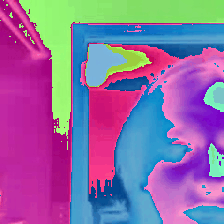

In [56]:
import os
import numpy as np
import imageio
from IPython.display import Image, display
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input

# Constants
NUM_CLASSES = 7  # Update with the number of classes in your dataset
BATCH_SIZE = 32  # Adjust based on available memory
IMAGE_SIZE = (224, 224)  # ResNet-50 default input size
MAX_SEQ_LENGTH = 100  # Adjust as needed

# Define your class labels
class_labels = ['BlowDryHair', 'BrushingTeeth', 'CuttingInKitchen', 'Haircut', 'MoppingFloor', 'Typing', 'WritingOnBoard']

# Define the data directory for your video frames
data_dir = r"C:\Users\khand\OneDrive\Desktop\CVR\train"

# Load your pre-trained model
model_path = "trained_model.keras"  # Replace with the path to your trained model
sequence_model = load_model(model_path)  # Load your trained model

# Load frames from a video sequence
def load_frames(video_path):
    frames = []
    for filename in os.listdir(video_path):
        if filename.endswith(".jpg"):  # Adjust the file extension as needed
            frame_path = os.path.join(video_path, filename)
            frame = image.load_img(frame_path, target_size=IMAGE_SIZE)
            frame = image.img_to_array(frame)
            frame = preprocess_input(frame)  # Preprocess the frame
            frames.append(frame)
    return np.array(frames)

# Function to predict the top 5 labels and their probabilities for a video
def predict_top_labels_with_probabilities(frames, model):
    probabilities = model.predict(frames)

    top_classes = np.argsort(probabilities)[0][::-1][:5]  # Get the top 5 predicted classes
    top_probabilities = [probabilities[0, i] for i in top_classes]

    top_labels = [class_labels[i] for i in top_classes]

    return top_labels, top_probabilities

# Set your paths and parameters
video_folder_to_test = r"C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g03_c04\v_BrushingTeeth_g03_c04"  # Replace with the path to your video frames folder

# Load frames from the video folder and preprocess them
frames_to_test = load_frames(video_folder_to_test)

# Predict the top 5 labels and their probabilities for the video frames
top_labels, top_probabilities = predict_top_labels_with_probabilities(frames_to_test, sequence_model)

# Print the top 5 predicted labels and their corresponding probabilities
print("Top 5 predicted labels with probabilities:")
for label, probability in zip(top_labels, top_probabilities):
    print(f"{label}: {probability * 100:.2f}%")

# Convert frames to uint8
frames_to_save = (frames_to_test * 255).astype(np.uint8)

# Save frames as a GIF
imageio.mimsave("output.gif", frames_to_save, format="gif")

# Display the GIF
display(Image(filename="output.gif"))


3/3 [==============================] - 18s 5s/step
Top 5 predicted labels with probabilities:
BrushingTeeth: 35.15%
MoppingFloor: 29.97%
CuttingInKitchen: 14.29%
WritingOnBoard: 9.27%
Typing: 4.26%


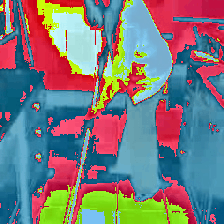

In [15]:
import os
import numpy as np
import imageio
from IPython.display import Image, display
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input

# Constants
NUM_CLASSES = 7  # Update with the number of classes in your dataset
BATCH_SIZE = 32  # Adjust based on available memory
IMAGE_SIZE = (224, 224)  # ResNet-50 default input size
MAX_SEQ_LENGTH = 100  # Adjust as needed

# Define your class labels
class_labels = ['BlowDryHair', 'BrushingTeeth', 'CuttingInKitchen', 'Haircut', 'MoppingFloor', 'Typing', 'WritingOnBoard']

# Define the data directory for your video frames
data_dir = r"C:\Users\khand\OneDrive\Desktop\CVR\train"

# Load your pre-trained model
model_path = "trained_model.keras"  # Replace with the path to your trained model
sequence_model = load_model(model_path)  # Load your trained model

# Load frames from a video sequence
def load_frames(video_path):
    frames = []
    for filename in os.listdir(video_path):
        if filename.endswith(".jpg"):  # Adjust the file extension as needed
            frame_path = os.path.join(video_path, filename)
            frame = image.load_img(frame_path, target_size=IMAGE_SIZE)
            frame = image.img_to_array(frame)
            frame = preprocess_input(frame)  # Preprocess the frame
            frames.append(frame)
    return np.array(frames)

# Function to predict the top 5 labels and their probabilities for a video
def predict_top_labels_with_probabilities(frames, model):
    probabilities = model.predict(frames)

    top_classes = np.argsort(probabilities)[0][::-1][:5]  # Get the top 5 predicted classes
    top_probabilities = [probabilities[0, i] for i in top_classes]

    top_labels = [class_labels[i] for i in top_classes]

    return top_labels, top_probabilities

# Set your paths and parameters
video_folder_to_test = r"C:\Users\khand\OneDrive\Desktop\CVR\test\MoppingFloor\v_MoppingFloor_g11_c03\v_MoppingFloor_g11_c03"  # Replace with the path to your video frames folder

# Load frames from the video folder and preprocess them
frames_to_test = load_frames(video_folder_to_test)

# Predict the top 5 labels and their probabilities for the video frames
top_labels, top_probabilities = predict_top_labels_with_probabilities(frames_to_test, sequence_model)

# Print the top 5 predicted labels and their corresponding probabilities
print("Top 5 predicted labels with probabilities:")
for label, probability in zip(top_labels, top_probabilities):
    print(f"{label}: {probability * 100:.2f}%")

# Convert frames to uint8
frames_to_save = (frames_to_test * 255).astype(np.uint8)

# Save frames as a GIF
imageio.mimsave("output.gif", frames_to_save, format="gif")

# Display the GIF
display(Image(filename="output.gif"))


In [18]:
#BRUSHING TEETH 
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input
import time

# Constants
NUM_CLASSES = 7  # Update with the number of classes in your dataset
IMAGE_SIZE = (224, 224)  # ResNet-50 default input size
TOP_N = 5  # Number of top predictions to save

# Define your class labels
class_labels = ['BlowDryHair', 'BrushingTeeth', 'CuttingInKitchen', 'Haircut', 'MoppingFloor', 'Typing', 'WritingOnBoard']

# Define the data directory for your test videos
base_dir = r"C:\Users\khand\OneDrive\Desktop\CVR\test"
class_folder = 'BrushingTeeth'  # Replace with the class folder you want to process

# Load your pre-trained model
model_path = "trained_model.keras"  # Replace with the path to your trained model
sequence_model = load_model(model_path)  # Load your trained model

# Compile the model with run_eagerly set to True
sequence_model.compile(run_eagerly=True)

# Force eager execution globally
tf.config.run_functions_eagerly(True)

# Function to load frames from a video sequence
def load_frames(video_path):
    frames = []
    for filename in os.listdir(video_path):
        if filename.endswith(".jpg"):  # Adjust the file extension as needed
            frame_path = os.path.join(video_path, filename)
            frame = image.load_img(frame_path, target_size=IMAGE_SIZE)
            frame = image.img_to_array(frame)
            frame = preprocess_input(frame)  # Preprocess the frame
            frames.append(frame)
    return np.array(frames)

# Create a DataFrame to store predictions
columns = ['Video']
for i in range(1, TOP_N + 1):
    columns.extend([f'Top Label {i}', f'Percentage {i}'])

predictions_df = pd.DataFrame(columns=columns)

# Function to predict the top N labels and their probabilities for a video
def predict_top_labels_with_probabilities(frames, model, top_n=TOP_N):
    batch_size = 32  # You can adjust this based on your available memory
    num_frames = len(frames)
    
    predictions_list = []
    
    for i in range(0, num_frames, batch_size):
        batch_frames = frames[i:i+batch_size]
        probabilities = model.predict(batch_frames)
        
        for j in range(len(batch_frames)):
            top_classes = np.argsort(probabilities[j])[::-1][:top_n]  # Get the top N predicted classes
            top_probabilities = [probabilities[j][k] for k in top_classes]
            top_labels = [class_labels[k] for k in top_classes]
            
            # Ensure that top_labels and top_probabilities have at least TOP_N elements
            while len(top_labels) < TOP_N:
                top_labels.append('N/A')
                top_probabilities.append(0.0)
            
            predictions_list.append([os.path.basename(video_folder_path)] + [f'{label}' for label in top_labels] + [f'{prob * 100:.2f}%' for prob in top_probabilities][:top_n])  # Limit to top_n elements
    
    return predictions_list

# Iterate through videos in the class folder and measure time
class_folder_path = os.path.join(base_dir, class_folder)
total_time_start = time.time()

def process_video_folder(video_folder_path):
    try:
        # Measure time for each video frame folder
        start_time = time.time()

        # Load frames from the video folder and preprocess them
        frames_to_test = load_frames(video_folder_path)

        # Predict the top N labels and their probabilities for the video frames
        predictions_list = predict_top_labels_with_probabilities(frames_to_test, sequence_model)

        # Store the predictions in the existing DataFrame
        for prediction in predictions_list:
            predictions_df.loc[len(predictions_df)] = prediction

        # Measure and print the time taken for each video frame folder
        end_time = time.time()
        print(f"Processed {video_folder_path} in {end_time - start_time:.2f} seconds")
    except Exception as e:
        print(f"Error processing {video_folder_path}: {str(e)}")

# Recursively process all video frame folders in the class folder
for root, dirs, files in os.walk(class_folder_path):
    for dir in dirs:
        video_folder_path = os.path.join(root, dir)
        process_video_folder(video_folder_path)

# Measure the total time taken
total_time_end = time.time()
print(f"Total processing time: {total_time_end - total_time_start:.2f} seconds")

# Define the path to save the CSV file
csv_file_path = r"C:\Users\khand\OneDrive\Desktop\test\brushing_teeth.csv"  # Modify the path as needed

# Save the predictions DataFrame to a CSV file
predictions_df.to_csv(csv_file_path, index=False)

print(f"Predictions saved to {csv_file_path}")


Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g02_c04 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g03_c04 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g03_c05 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g04_c04 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g05_c03 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g06_c05 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g07_c05 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g07_c06 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g08_c02 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\Brus

C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g02_c04\v_BrushingTeeth_g02_c04 in 70.95 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 2s 2s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g03_c04\v_BrushingTeeth_g03_c04 in 21.72 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g03_c05\v_BrushingTeeth_g03_c05 in 25.50 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 2s 2s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g04_c04\v_BrushingTeeth_g04_c04 in 9.42 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 2s 2s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g05_c03\v_BrushingTeeth_g05_c03 in 23.13 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 555ms/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g06_c05\v_BrushingTeeth_g06_c05 in 23.62 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 2s 2s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g07_c05\v_BrushingTeeth_g07_c05 in 25.73 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 0s 365ms/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g07_c06\v_BrushingTeeth_g07_c06 in 24.59 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 3s 3s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g08_c02\v_BrushingTeeth_g08_c02 in 18.13 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 540ms/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g09_c01\v_BrushingTeeth_g09_c01 in 9.83 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g09_c02\v_BrushingTeeth_g09_c02 in 10.27 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 2s 2s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g10_c04\v_BrushingTeeth_g10_c04 in 24.52 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 2s 2s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g11_c02\v_BrushingTeeth_g11_c02 in 23.23 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 2s 2s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g11_c03\v_BrushingTeeth_g11_c03 in 23.14 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 3s 3s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g12_c01\v_BrushingTeeth_g12_c01 in 24.86 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 3s 3s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g12_c05\v_BrushingTeeth_g12_c05 in 27.37 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 937ms/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g15_c03\v_BrushingTeeth_g15_c03 in 20.24 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 2s 2s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g15_c04\v_BrushingTeeth_g15_c04 in 20.38 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 992ms/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g18_c04\v_BrushingTeeth_g18_c04 in 32.33 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1000ms/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g18_c05\v_BrushingTeeth_g18_c05 in 27.27 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 848ms/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g22_c05\v_BrushingTeeth_g22_c05 in 18.70 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g23_c01\v_BrushingTeeth_g23_c01 in 23.33 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 3s 3s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g23_c03\v_BrushingTeeth_g23_c03 in 27.96 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g23_c06\v_BrushingTeeth_g23_c06 in 26.49 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 2s 2s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\BrushingTeeth\v_BrushingTeeth_g24_c07\v_BrushingTeeth_g24_c07 in 23.86 seconds
Total processing time: 606.87 seconds
Predictions saved to C:\Users\khand\OneDrive\Desktop\test\brushing_teeth.csv


In [18]:
#CUTTING
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input
import time

# Constants
NUM_CLASSES = 7  # Update with the number of classes in your dataset
IMAGE_SIZE = (224, 224)  # ResNet-50 default input size
TOP_N = 5  # Number of top predictions to save

# Define your class labels
class_labels = ['BlowDryHair', 'BrushingTeeth', 'CuttingInKitchen', 'Haircut', 'MoppingFloor', 'Typing', 'WritingOnBoard']

# Define the data directory for your test videos
base_dir = r"C:\Users\khand\OneDrive\Desktop\CVR\test"
class_folder = 'CuttingInKitchen'  # Replace with the class folder you want to process

# Load your pre-trained model
model_path = "trained_model.keras"  # Replace with the path to your trained model
sequence_model = load_model(model_path)  # Load your trained model

# Compile the model with run_eagerly set to True
sequence_model.compile(run_eagerly=True)

# Force eager execution globally
tf.config.run_functions_eagerly(True)

# Function to load frames from a video sequence
def load_frames(video_path):
    frames = []
    for filename in os.listdir(video_path):
        if filename.endswith(".jpg"):  # Adjust the file extension as needed
            frame_path = os.path.join(video_path, filename)
            frame = image.load_img(frame_path, target_size=IMAGE_SIZE)
            frame = image.img_to_array(frame)
            frame = preprocess_input(frame)  # Preprocess the frame
            frames.append(frame)
    return np.array(frames)

# Create a DataFrame to store predictions
columns = ['Video']
for i in range(1, TOP_N + 1):
    columns.extend([f'Top Label {i}', f'Percentage {i}'])

predictions_df = pd.DataFrame(columns=columns)

# Function to predict the top N labels and their probabilities for a video
def predict_top_labels_with_probabilities(frames, model, top_n=TOP_N):
    batch_size = 32  # You can adjust this based on your available memory
    num_frames = len(frames)
    
    predictions_list = []
    
    for i in range(0, num_frames, batch_size):
        batch_frames = frames[i:i+batch_size]
        probabilities = model.predict(batch_frames)
        
        for j in range(len(batch_frames)):
            top_classes = np.argsort(probabilities[j])[::-1][:top_n]  # Get the top N predicted classes
            top_probabilities = [probabilities[j][k] for k in top_classes]
            top_labels = [class_labels[k] for k in top_classes]
            
            # Ensure that top_labels and top_probabilities have at least TOP_N elements
            while len(top_labels) < TOP_N:
                top_labels.append('N/A')
                top_probabilities.append(0.0)
            
            predictions_list.append([os.path.basename(video_folder_path)] + [f'{label}' for label in top_labels] + [f'{prob * 100:.2f}%' for prob in top_probabilities][:top_n])  # Limit to top_n elements
    
    return predictions_list

# Iterate through videos in the class folder and measure time
class_folder_path = os.path.join(base_dir, class_folder)
total_time_start = time.time()

def process_video_folder(video_folder_path):
    try:
        # Measure time for each video frame folder
        start_time = time.time()

        # Load frames from the video folder and preprocess them
        frames_to_test = load_frames(video_folder_path)

        # Predict the top N labels and their probabilities for the video frames
        predictions_list = predict_top_labels_with_probabilities(frames_to_test, sequence_model)

        # Store the predictions in the existing DataFrame
        for prediction in predictions_list:
            predictions_df.loc[len(predictions_df)] = prediction

        # Measure and print the time taken for each video frame folder
        end_time = time.time()
        print(f"Processed {video_folder_path} in {end_time - start_time:.2f} seconds")
    except Exception as e:
        print(f"Error processing {video_folder_path}: {str(e)}")

# Recursively process all video frame folders in the class folder
for root, dirs, files in os.walk(class_folder_path):
    for dir in dirs:
        video_folder_path = os.path.join(root, dir)
        process_video_folder(video_folder_path)

# Measure the total time taken
total_time_end = time.time()
print(f"Total processing time: {total_time_end - total_time_start:.2f} seconds")

# Define the path to save the CSV file
csv_file_path = r"C:\Users\khand\OneDrive\Desktop\train\cutting_in_kitchen.csv"  # Modify the path as needed

# Save the predictions DataFrame to a CSV file
predictions_df.to_csv(csv_file_path, index=False)

print(f"Predictions saved to {csv_file_path}")


Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g01_c02 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g01_c05 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g05_c02 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g05_c06 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g07_c02 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g08_c03 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g09_c01 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g11_c03 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g13_c03 in 0.00 seconds
P

C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 2s 2s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g01_c02\v_CuttingInKitchen_g01_c02 in 22.92 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 6s 6s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g01_c05\v_CuttingInKitchen_g01_c05 in 45.95 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 2s 2s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g05_c02\v_CuttingInKitchen_g05_c02 in 54.07 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 3s 3s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g05_c06\v_CuttingInKitchen_g05_c06 in 30.44 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 6s 6s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g07_c02\v_CuttingInKitchen_g07_c02 in 13.64 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 6s 6s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g08_c03\v_CuttingInKitchen_g08_c03 in 54.31 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 4s 4s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g09_c01\v_CuttingInKitchen_g09_c01 in 45.68 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g11_c03\v_CuttingInKitchen_g11_c03 in 15.26 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 4s 4s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g13_c03\v_CuttingInKitchen_g13_c03 in 31.55 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 2s 2s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g13_c04\v_CuttingInKitchen_g13_c04 in 29.83 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g16_c04\v_CuttingInKitchen_g16_c04 in 42.44 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 3s 3s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g17_c04\v_CuttingInKitchen_g17_c04 in 30.52 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g22_c04\v_CuttingInKitchen_g22_c04 in 56.04 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 5s 5s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g23_c04\v_CuttingInKitchen_g23_c04 in 18.66 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 4s 4s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g24_c02\v_CuttingInKitchen_g24_c02 in 24.54 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 6s 6s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g25_c02\v_CuttingInKitchen_g25_c02 in 34.32 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 536ms/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\CuttingInKitchen\v_CuttingInKitchen_g25_c04\v_CuttingInKitchen_g25_c04 in 28.01 seconds
Total processing time: 578.45 seconds
Predictions saved to C:\Users\khand\OneDrive\Desktop\train\cutting_in_kitchen.csv


In [47]:
#PER VIDEO WISE EXTRACTION INTO A CSV FILE 
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input
import time

# Constants
NUM_CLASSES = 7  # Update with the number of classes in your dataset
IMAGE_SIZE = (224, 224)  # ResNet-50 default input size
TOP_N = 5  # Number of top predictions to save

# Define your class labels
class_labels = ['BlowDryHair', 'BrushingTeeth', 'CuttingInKitchen', 'Haircut', 'MoppingFloor', 'Typing', 'WritingOnBoard']

# Define the data directory for your test videos
base_dir = r"C:\Users\khand\OneDrive\Desktop\CVR\test"
class_folder = 'WritingOnBoard' # Replace with the class folder you want to process

# Load your pre-trained model
model_path = "trained_model.keras"  # Replace with the path to your trained model
sequence_model = load_model(model_path)  # Load your trained model

# Compile the model with run_eagerly set to True
sequence_model.compile(run_eagerly=True)

# Force eager execution globally
tf.config.run_functions_eagerly(True)

# Function to load frames from a video sequence
def load_frames(video_path):
    frames = []
    for filename in os.listdir(video_path):
        if filename.endswith(".jpg"):  # Adjust the file extension as needed
            frame_path = os.path.join(video_path, filename)
            frame = image.load_img(frame_path, target_size=IMAGE_SIZE)
            frame = image.img_to_array(frame)
            frame = preprocess_input(frame)  # Preprocess the frame
            frames.append(frame)
    return np.array(frames)

# Create a DataFrame to store predictions
columns = ['Video']
for i in range(1, TOP_N + 1):
    columns.extend([f'Top Label {i}', f'Percentage {i}'])

predictions_df = pd.DataFrame(columns=columns)

# Function to predict the top N labels and their probabilities for a video
def predict_top_labels_with_probabilities(frames, model, top_n=TOP_N):
    batch_size = 32  # You can adjust this based on your available memory
    num_frames = len(frames)
    
    predictions_list = []
    
    for i in range(0, num_frames, batch_size):
        batch_frames = frames[i:i+batch_size]
        probabilities = model.predict(batch_frames)
        
        for j in range(len(batch_frames)):
            top_classes = np.argsort(probabilities[j])[::-1][:top_n]  # Get the top N predicted classes
            top_probabilities = [probabilities[j][k] for k in top_classes]
            top_labels = [class_labels[k] for k in top_classes]
            
            # Ensure that top_labels and top_probabilities have at least TOP_N elements
            while len(top_labels) < TOP_N:
                top_labels.append('N/A')
                top_probabilities.append(0.0)
            
            predictions_list.append([os.path.basename(video_folder_path)] + [f'{label}' for label in top_labels] + [f'{prob * 100:.2f}%' for prob in top_probabilities][:top_n])  # Limit to top_n elements
    
    return predictions_list

# Iterate through videos in the class folder and measure time
class_folder_path = os.path.join(base_dir, class_folder)
total_time_start = time.time()

def process_video_folder(video_folder_path):
    try:
        # Measure time for each video frame folder
        start_time = time.time()

        # Load frames from the video folder and preprocess them
        frames_to_test = load_frames(video_folder_path)

        # Predict the top N labels and their probabilities for the video frames
        predictions_list = predict_top_labels_with_probabilities(frames_to_test, sequence_model)

        # Store the predictions in the existing DataFrame
        for prediction in predictions_list:
            predictions_df.loc[len(predictions_df)] = prediction

        # Measure and print the time taken for each video frame folder
        end_time = time.time()
        print(f"Processed {video_folder_path} in {end_time - start_time:.2f} seconds")
    except Exception as e:
        print(f"Error processing {video_folder_path}: {str(e)}")

# Recursively process all video frame folders in the class folder
for root, dirs, files in os.walk(class_folder_path):
    for dir in dirs:
        video_folder_path = os.path.join(root, dir)
        process_video_folder(video_folder_path)

# Measure the total time taken
total_time_end = time.time()
print(f"Total processing time: {total_time_end - total_time_start:.2f} seconds")

# Define the path to save the CSV file
csv_file_path = r"C:\Users\khand\OneDrive\Desktop\train\writing_on_the_board.csv"# Modify the path as needed

# Save the predictions DataFrame to a CSV file
predictions_df.to_csv(csv_file_path, index=False)

print(f"Predictions saved to {csv_file_path}")


Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g02_c01 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g03_c03 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g03_c07 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g05_c05 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g06_c01 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g06_c05 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g07_c02 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g07_c04 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g09_c02 in 0.00 seconds
Processed C:\Users\khand\OneDrive\Des

C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 2s 2s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g02_c01\v_WritingOnBoard_g02_c01 in 17.53 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 2s 2s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g03_c03\v_WritingOnBoard_g03_c03 in 11.33 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 3s 3s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g03_c07\v_WritingOnBoard_g03_c07 in 9.52 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 2s 2s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g05_c05\v_WritingOnBoard_g05_c05 in 11.74 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 3s 3s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g06_c01\v_WritingOnBoard_g06_c01 in 10.66 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 5s 5s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g06_c05\v_WritingOnBoard_g06_c05 in 26.81 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 648ms/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g07_c02\v_WritingOnBoard_g07_c02 in 20.53 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 3s 3s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g07_c04\v_WritingOnBoard_g07_c04 in 13.72 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 0s 454ms/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g09_c02\v_WritingOnBoard_g09_c02 in 18.40 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 571ms/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g11_c06\v_WritingOnBoard_g11_c06 in 17.14 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 597ms/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g15_c02\v_WritingOnBoard_g15_c02 in 10.05 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g15_c04\v_WritingOnBoard_g15_c04 in 21.41 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 0s 313ms/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g16_c01\v_WritingOnBoard_g16_c01 in 19.73 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 3s 3s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g16_c03\v_WritingOnBoard_g16_c03 in 14.35 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 2s 2s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g16_c04\v_WritingOnBoard_g16_c04 in 17.74 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 2s 2s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g16_c06\v_WritingOnBoard_g16_c06 in 31.04 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 3s 3s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g16_c07\v_WritingOnBoard_g16_c07 in 29.00 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 824ms/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g19_c02\v_WritingOnBoard_g19_c02 in 15.09 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g20_c01\v_WritingOnBoard_g20_c01 in 33.15 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g20_c03\v_WritingOnBoard_g20_c03 in 18.55 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 550ms/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g21_c01\v_WritingOnBoard_g21_c01 in 14.37 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 2s 2s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g21_c04\v_WritingOnBoard_g21_c04 in 15.93 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 4s 4s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g22_c06\v_WritingOnBoard_g22_c06 in 17.18 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g22_c07\v_WritingOnBoard_g22_c07 in 24.48 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 3s 3s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g23_c01\v_WritingOnBoard_g23_c01 in 34.33 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g25_c02\v_WritingOnBoard_g25_c02 in 14.00 seconds


C:\Users\khand\anaconda3\trial\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1s/step
Processed C:\Users\khand\OneDrive\Desktop\CVR\test\WritingOnBoard\v_WritingOnBoard_g25_c04\v_WritingOnBoard_g25_c04 in 17.51 seconds
Total processing time: 505.54 seconds
Predictions saved to C:\Users\khand\OneDrive\Desktop\train\writing_on_the_board.csv


In [55]:
import pandas as pd

# Specify the path to your CSV file
csv_path = r"C:\Users\khand\OneDrive\Desktop\train\writing_on_the_board.csv"

# Load the CSV file into a DataFrame
df = pd.read_csv(csv_path)

# Define the new column order and names
new_columns = ['Video', 'Top Label 1', 'Percentage 1', 'Top Label 2', 'Percentage 2', 'Top Label 3', 'Percentage 3', 'Top Label 4', 'Percentage 4', 'Top Label 5', 'Percentage 5']

# Rename the columns of the DataFrame using the specified names
df.columns = new_columns

# Save the modified DataFrame back to the CSV file
df.to_csv(csv_path, index=False)


In [58]:
#combine all the csv files together 
import pandas as pd
import glob

# Specify the folder where your CSV files are located
folder_path = r"C:\Users\khand\OneDrive\Desktop\train"

# Use glob to get a list of all CSV files in the folder
csv_files = glob.glob(f"{folder_path}\*.csv")

# Initialize an empty DataFrame to store the combined data
combined_df = pd.DataFrame()

# Iterate through the CSV files and append their data to the combined DataFrame
for csv_file in csv_files:
    df = pd.read_csv(csv_file)
    combined_df = combined_df.append(df, ignore_index=True)

# Specify the path for the combined CSV file
combined_csv_path = r"C:\Users\khand\OneDrive\Desktop\test\predictions.csv"

# Save the combined DataFrame to a CSV file
combined_df.to_csv(combined_csv_path, index=False)

print("CSV files have been successfully combined and saved as 'combined.csv'.")


C:\Users\khand\AppData\Local\Temp\ipykernel_3376\1088147291.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  combined_df = combined_df.append(df, ignore_index=True)
C:\Users\khand\AppData\Local\Temp\ipykernel_3376\1088147291.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  combined_df = combined_df.append(df, ignore_index=True)
C:\Users\khand\AppData\Local\Temp\ipykernel_3376\1088147291.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  combined_df = combined_df.append(df, ignore_index=True)
C:\Users\khand\AppData\Local\Temp\ipykernel_3376\1088147291.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  combined_df = combined_d

CSV files have been successfully combined and saved as 'combined.csv'.
